In [1]:
import os
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import set_matplotlib_formats
from glob import glob
import random
from IPython.display import display
from ipywidgets import interact
import ipywidgets as widgets
import skimage
import pathlib
import tifffile
import time
from pathlib import Path
from scipy.stats import scoreatpercentile
from collections import Counter
import sys 

sys.path.append("..")
import src.ImagePreprocessFilters as IPrep
import src.ImageParser as IP

In [2]:
# path_images_raw = './data/IMC_ESD/2.ROIs_raw/'
path_images_raw = '../data/IMC_ESD/raw'
fovs = os.listdir(path_images_raw)
print(fovs)

['ESD4_02', 'ESD4_03', 'ESD1_05', 'ESD2_05', 'ESD8_05', 'ESD7_03', 'ESD7_08', 'ESD1_02', 'ESD7_04', 'ESD6_03', 'ESD4_05', 'ESD7_07', 'ESD2_03', 'ESD3_08', 'ESD3_06', 'ESD3_07', 'ESD8_04', 'ESD7_06', 'ESD1_03', 'ESD5_05', 'ESD8_03', 'ESD5_03', 'ESD6_07', 'ESD4_01', 'ESD2_02', 'ESD6_04', 'ESD6_02', 'ESD5_02', 'ESD3_03', 'ESD2_06', 'ESD2_01', 'ESD4_04', 'ESD8_09', 'ESD1_04', 'ESD7_09', 'ESD3_05', 'ESD1_08', 'ESD3_01', 'ESD8_01', 'ESD7_05', 'ESD8_07', 'ESD6_08', 'ESD8_08', 'ESD5_01', 'ESD5_04', 'ESD3_02', 'ESD3_04', 'ESD6_09', 'ESD5_06', 'ESD6_06', 'ESD7_01', 'ESD6_05', 'ESD8_06', 'ESD2_04', 'ESD1_09', 'ESD7_02', 'ESD1_01', 'ESD8_02', 'ESD6_01', 'ESD1_06', 'ESD1_07']


In [3]:
channels = ['CD20', 'Vimentin', 'PD-L1', 'CD31', 'CD163', 'VISTA', 'Ki-67', 'DNA2', 'IDO',
            'FOXP3', 'CD68', 'CD57', 'CD14', 'D2-40', 'CD56', 'CD45RO', 'DNA1', 'CD11c', 'CD7',
            'HLA-DR', 'CD204', 'CD8a', 'P16Ink4a', 'CD3', 'Granzyme B', 'Bcatenin',
            'Caspase', 'CD4', 'CD103', 'TGFbeta', 'PD-1', 'CD45', 'LAG-3', 
            'ICOS', 'CD11b', 'Keratin', 'TCRgd', 'CD15', 'TIM-3', 'CD38', 'Tbet', 'CD39']
channel_to_index = {name: index for index, name in enumerate(channels)}

def get_files_from_dir(fov):
    fov_folder = os.path.join(path_images_raw, fov)
    fov_files = os.listdir(fov_folder)
    fov_files = [filename for filename in fov_files if filename.lower().endswith((".tiff", ".tif"))]
    fov_files = [os.path.join(fov_folder, file) for file in fov_files]
    return fov_files

def get_stack(fov_files):
    # get a stack of images
    stack = []
    for channel in channels:   
        file = [filename for filename in fov_files if channel in filename][0]
        img_apeer, _ = io.read_ometiff(file)
        img = img_apeer.squeeze()
        stack.append(np.array(img))
    stack = np.stack(stack, axis = -1)
    return stack

def plot_comparison(image1, image2, channel_to_compare):

    plt.figure(figsize=(10, 5), dpi = 500)
    plt.subplot(1, 2, 1)
    plt.imshow(image1, cmap='gray') #,vmin = 0, vmax = 1
    plt.title(channel_to_compare)

    plt.subplot(1, 2, 2)
    plt.imshow(image2, cmap = 'gray') # , vmin = 0, vmax = 1
    plt.title(channel_to_compare)

    plt.show()

        
# functions for neigbooring and counting pixels analysis
def get_counts_neigh(image):
    # Threshold the image to get binary values
    binary_image = (image > 0).astype(np.uint8)
    positive_pixel_count = np.count_nonzero(binary_image)
#     print(positive_pixel_count)
    # Find the coordinates of positive (non-zero) pixels in the binary image
    positive_pixel_coords = np.argwhere(binary_image == 1)

    # Initialize lists to store results
    positive_counts = []
    medians = []
    percentile_25 = []
    percentile_75 = []
    # Iterate through positive pixels
    for coord in positive_pixel_coords:
        y, x = coord[0], coord[1]
        
        # Extract the 3x3 window around the current positive pixel
        # Define the coordinates for the 3x3 window
        y_start, y_end = max(y - 1, 0), min(y + 2, binary_image.shape[0])
        x_start, x_end = max(x - 1, 0), min(x + 2, binary_image.shape[1])

        # Extract the 3x3 window around the current positive pixel
        window = binary_image[y_start:y_end, x_start:x_end]
            
        # Count positive pixels in the 3x3 window
        positive_count = np.count_nonzero(window)
        positive_counts.append(positive_count)

        # Calculate the median and percentiles
        
        window = image[y_start:y_end, x_start:x_end]
        median = np.median(window)
        p_25 = scoreatpercentile(window, 25)
        p_75 = scoreatpercentile(window, 75)

        # Append the statistics to the respective lists
        medians.append(median)
        percentile_25.append(p_25)
        percentile_75.append(p_75)
    return positive_counts, medians, percentile_25, percentile_75


def plot_hist_positive_neig(positive_counts1,positive_counts2, title=[]):
    # Create a figure with two subplots (side by side)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    ylim_max = 90000
    # Plot the first histogram on the left subplot
    axes[0].hist(positive_counts1, bins=range(max(positive_counts1) + 2), rwidth=0.8, align='left')
    axes[0].set_xlabel('Number of neighboring Positive Pixels of positive pixels')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title(title[0])
    axes[0].set_ylim(top=ylim_max)


    # Plot the second histogram on the right subplot
    axes[1].hist(positive_counts2, bins=range(max(positive_counts2) + 2), rwidth=0.8, align='left')
    axes[1].set_xlabel('Number of neighboring Positive Pixels of positive pixels')
    axes[1].set_ylabel('Frequency')
    axes[1].set_title(title[1])
    axes[1].set_ylim(top=ylim_max)

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()

def plot_percentiles(list1,list2, titles):
    # Create two separate figures for the first and second graphs
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ylim_max = 250000
    # Plot the distribution of medians and percentiles for the first graph
    ax1.hist(list1, bins=10, color=['blue', 'green', 'red'], alpha=0.7, label=['Median', 'Percentile 25', 'Percentile 75'])
    ax1.set_ylim(top=ylim_max)
    ax1.set_xlabel('Values')
    ax1.set_ylabel('Frequency')
    ax1.set_title(f'Distribution of Medians and Percentiles ({titles[0]})')
    ax1.legend()
    # Plot the distribution of medians and percentiles for the first graph
    ax2.hist(list2, bins=10, color=['blue', 'green', 'red'], alpha=0.7, label=['Median', 'Percentile 25', 'Percentile 75'])
    ax2.set_ylim(top=ylim_max)
    ax2.set_xlabel('Values')
    ax2.set_ylabel('Frequency')
    ax2.set_title(f'Distribution of Medians and Percentiles ({titles[1]})')
    ax1.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()
    
    

In [4]:
# get all channel files for all FOVS 


channel_to_compare = 'CD20.'
directory = Path('../data/IMC_ESD/raw')
matching_files = [str(file) for file in directory.rglob('*') if channel_to_compare in file.name]

images_ch = []
images_ch_norm = []
for img in matching_files:
    img_p = IP.parse_image(img)
    img_out = IP.remove_outliers(img_p, up_limit=99, down_limit=1)
    img_norm = IP.normalize_by_channel(img_out)
    images_ch.append(img_p)
    images_ch_norm.append(img_norm)

/home/martinha/PycharmProjects/phd/Preprocess_IMC/comparison/../src/ImageParser.py:186: RuntimeWarning: invalid value encountered in divide
  new_img = (v - v_min) / (v_max - v_min)


In [5]:
# apply percentile
start = time.time()

PERCENTILE = 50
imgs_images_ch_norm_p = []

for img in images_ch_norm:
    filtered = IPrep.percentile_filter(img, window_size=3, percentile=PERCENTILE)
    imgs_images_ch_norm_p.append(filtered)
    
end = time.time()
print(f"{end - start} seconds for {len(images_ch_norm)} images")

2.289689779281616 seconds for 61 images


In [6]:
# Create a directory to store the images
output_dir = 'img_results/PENGUIN/FOXP3/p90/'
os.makedirs(output_dir, exist_ok=True)
for i in range(len(fovs)):
    fov = fovs[i]
    img_p = imgs_images_ch_norm_p[i]
    filename = os.path.join(output_dir, f"{fov}.tiff") 
    tifffile.imwrite(filename,np.float32(img_p),
                 photometric="minisblack")

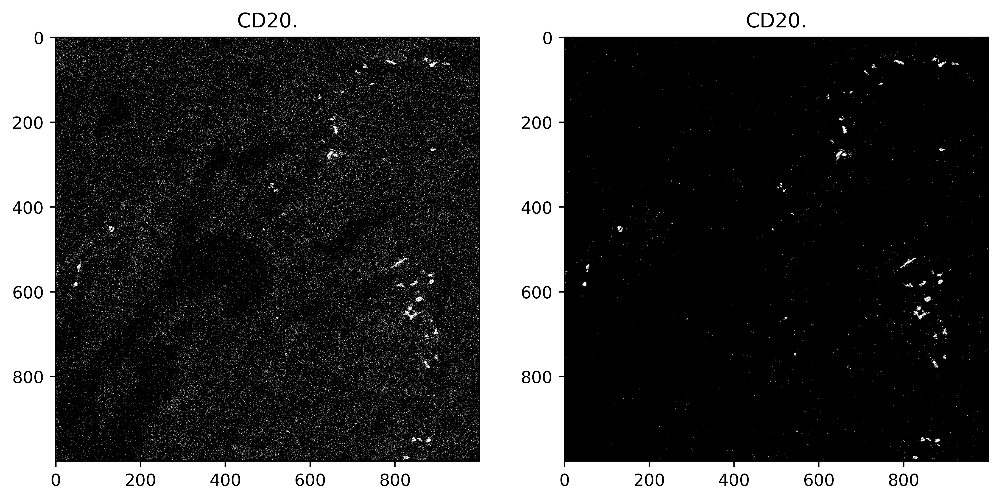

In [7]:
plot_comparison(images_ch[2], imgs_images_ch_norm_p[2], channel_to_compare)

In [8]:
# apply percentile

PERCENTILE = [10,25,50,75,90]
imgs_ch_norm_p10 = []
imgs_ch_norm_p25 = []
imgs_ch_norm_p50 = []
imgs_ch_norm_p75 = []
imgs_ch_norm_p90 = []


for img in images_ch_norm:
    imgs_ch_norm_p10.append(IPrep.percentile_filter(img, percentile=10))
    imgs_ch_norm_p25.append(IPrep.percentile_filter(img, percentile=25))
    imgs_ch_norm_p50.append(IPrep.percentile_filter(img, percentile=50))
    imgs_ch_norm_p75.append(IPrep.percentile_filter(img, percentile=75))
    imgs_ch_norm_p90.append(IPrep.percentile_filter(img, percentile=90))

In [9]:
index = 0
p_or = images_ch_norm[index]
p_90 = imgs_ch_norm_p90[index]
p_75 = imgs_ch_norm_p75[index]
p_50 = imgs_ch_norm_p50[index]
p_25 = imgs_ch_norm_p25[index]
p_10 = imgs_ch_norm_p10[index]

images = [p_or, p_90,p_75,p_50,p_25,p_10]

positive_counts_or, medians_or, percentile_25_or, percentile_75_or = get_counts_neigh(p_or)
positive_counts_p10, medians_p10, percentile_25_p10, percentile_75_p10 = get_counts_neigh(p_10)
positive_counts_p25, medians_p25, percentile_25_p25, percentile_75_p25 = get_counts_neigh(p_25)
positive_counts_p50, medians_p50, percentile_25_p50, percentile_75_p50 = get_counts_neigh(p_50)
positive_counts_p75, medians_p75, percentile_25_p75, percentile_75_p75 = get_counts_neigh(p_75)
positive_counts_p90, medians_p90, percentile_25_p90, percentile_75_p90 = get_counts_neigh(p_90)


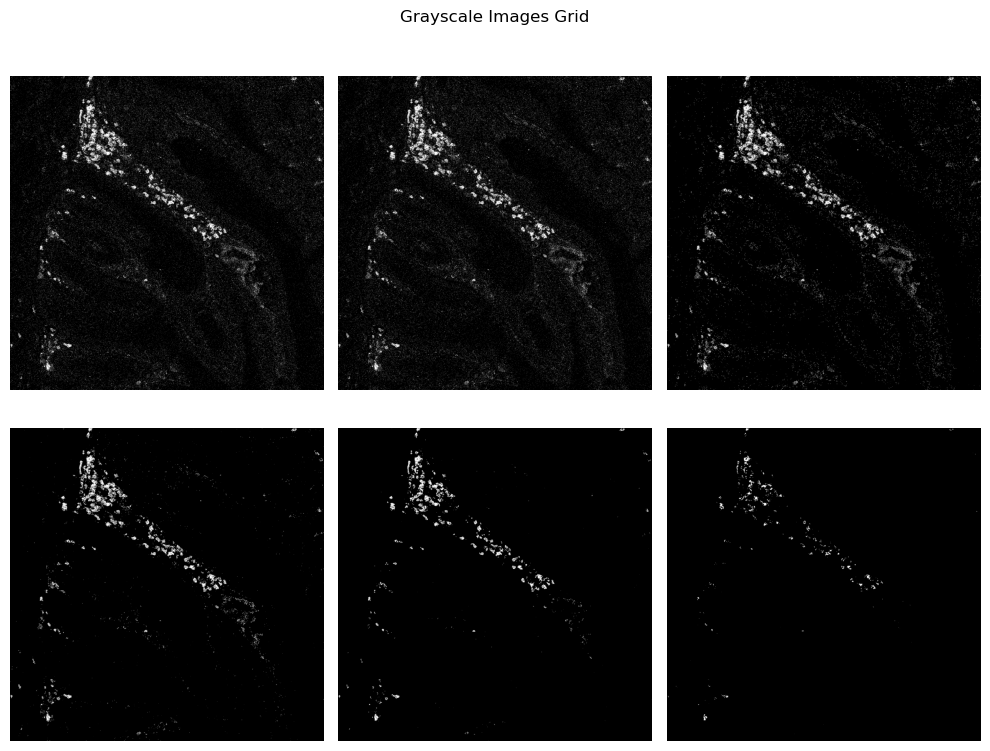

In [10]:
# Create a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(10, 8))

# Loop through the images and plot them in the grid
for i in range(2):
    for j in range(3):
        index = i * 3 + j
        if index < len(images):
            axes[i, j].imshow(images[index], cmap='gray')
            axes[i, j].axis('off')  # Turn off axis labels

# Add a title (optional)
plt.suptitle("Grayscale Images Grid")

# Adjust spacing between subplots (optional)
plt.tight_layout()

# Display the grid of images
plt.show()

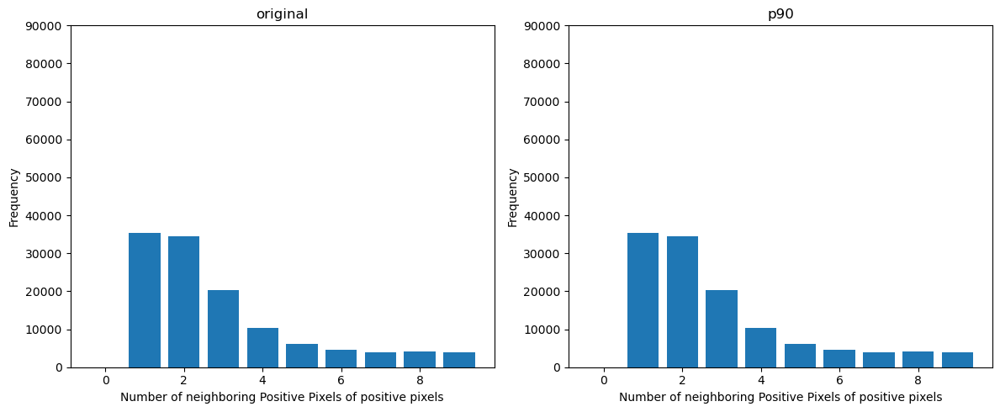

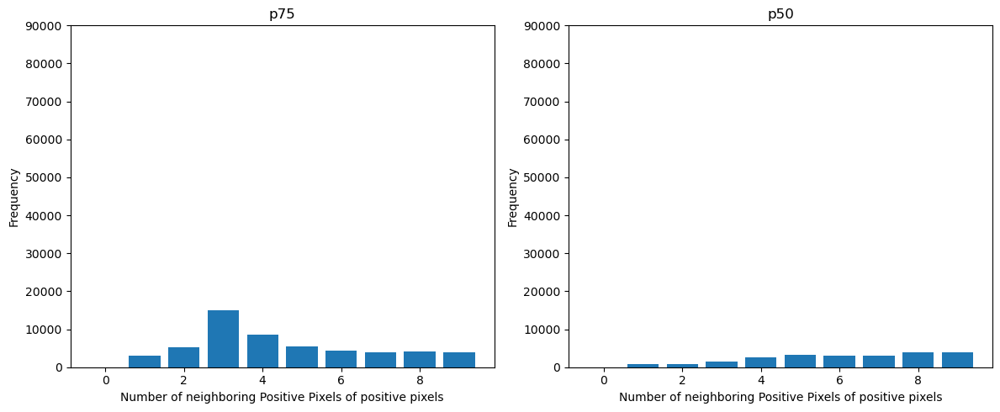

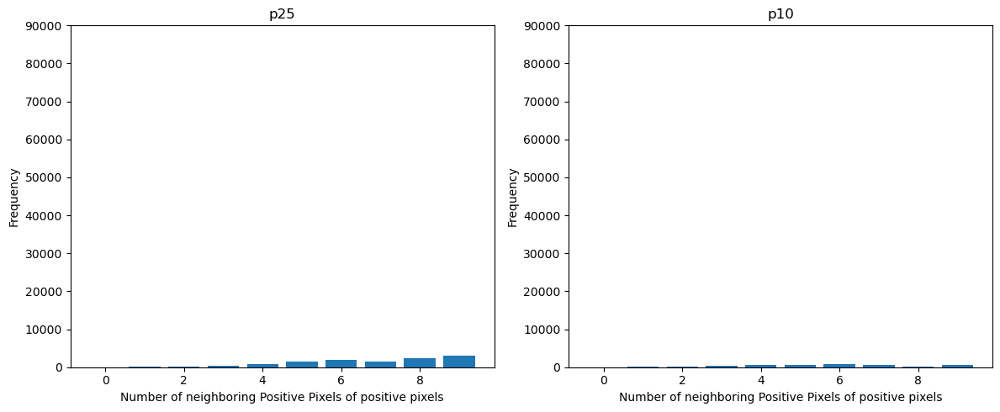

In [11]:
# histogram fo counts
plot_hist_positive_neig(positive_counts_or,positive_counts_p90, title=['original', 'p90'])
plot_hist_positive_neig(positive_counts_p75,positive_counts_p50, title=['p75', 'p50'])
plot_hist_positive_neig(positive_counts_p25,positive_counts_p10, title=['p25', 'p10'])

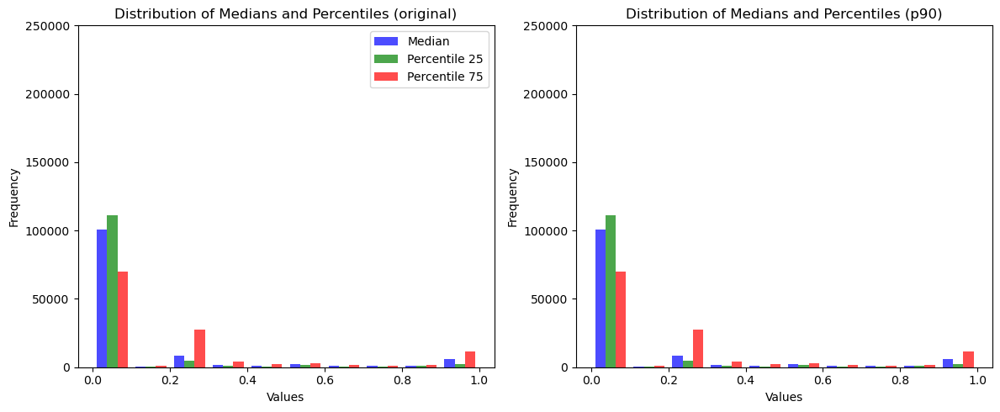

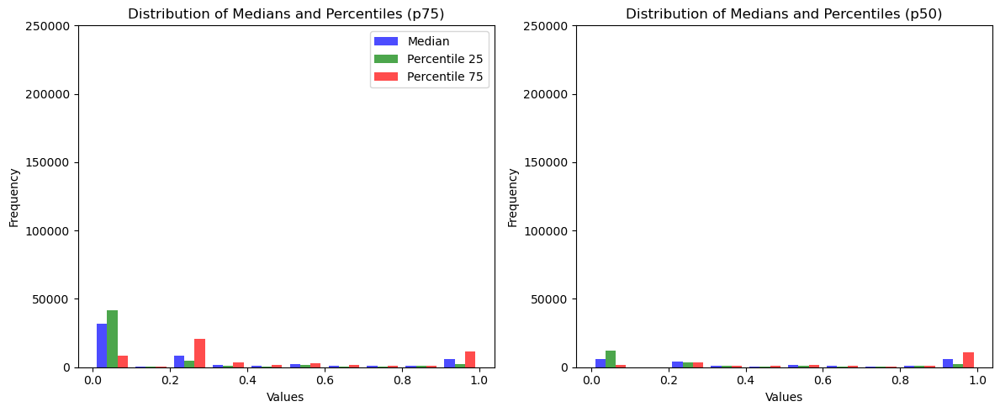

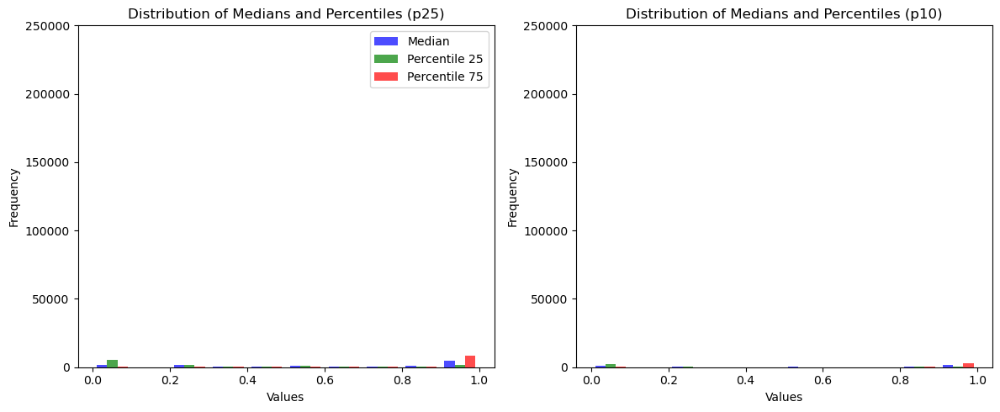

In [12]:
# histogram of percentiles   
list1 = [medians_or, percentile_25_or, percentile_75_or]
list2 = [medians_p90, percentile_25_p90, percentile_75_p90]
list3 = [medians_p75, percentile_25_p75, percentile_75_p75]
list4 = [medians_p50, percentile_25_p50, percentile_75_p50]
list5 = [medians_p25, percentile_25_p25, percentile_75_p25]
list6 = [medians_p10, percentile_25_p10, percentile_75_p10]
plot_percentiles(list1,list2, ['original', 'p90'])
plot_percentiles(list3,list4, ['p75', 'p50'])
plot_percentiles(list5,list6,['p25', 'p10'])

Add threshold prior to percentile

In [16]:
channel_to_compare = 'CD20.'
directory = Path('../data/IMC_ESD/raw')
matching_files = [str(file) for file in directory.rglob('*') if channel_to_compare in file.name]


images_ch = []
images_ch_norm = []
imgs_images_ch_norm_p = []

PERCENTILE = 50
THRESHOLD = 0.50

start = time.time()

for img in matching_files:
    img_p = IP.parse_image(img)
    img_out = IP.remove_outliers(img_p, up_limit=99, down_limit=1)
    img_norm = IP.normalize_by_channel(img_out)
    images_ch.append(img_p)
    images_ch_norm.append(img_norm)
    # apply threshold
    filtered = IPrep.thresholding(img_norm, th=THRESHOLD)
    # apply percentile
    filtered = IPrep.percentile_filter(filtered, window_size=3, percentile=PERCENTILE)
    imgs_images_ch_norm_p.append(filtered)
     
end = time.time()
print(f"{end - start} seconds for {len(images_ch_norm)} images")

2.849660873413086 seconds for 61 images


In [17]:
# Create a directory to store the images
output_dir = 'img_results/PENGUIN/CD20/p50_th50/'
os.makedirs(output_dir, exist_ok=True)
for i in range(len(fovs)):
    fov = fovs[i]
    img_p = imgs_images_ch_norm_p[i]
    filename = os.path.join(output_dir, f"{fov}.tiff") 
    tifffile.imwrite(filename,np.float32(img_p),
                 photometric="minisblack")
    

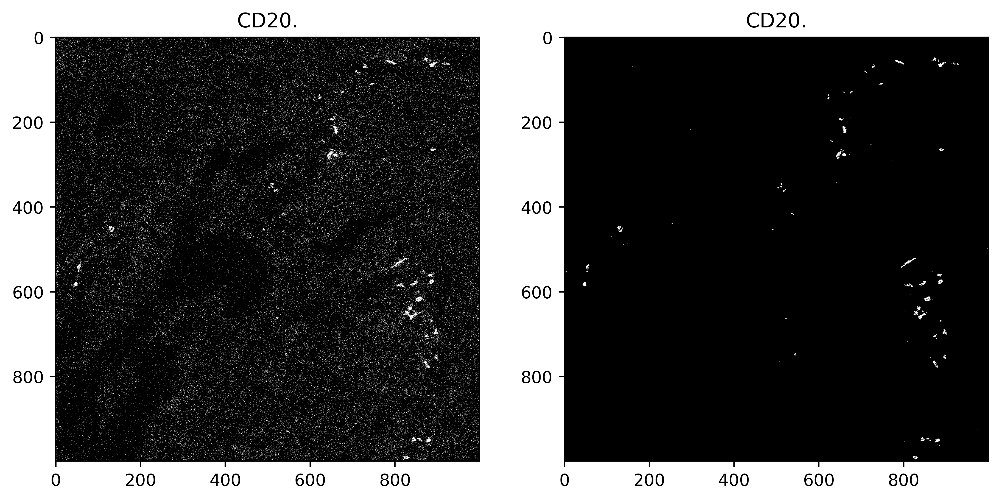

In [18]:
plot_comparison(images_ch[2], imgs_images_ch_norm_p[2], channel_to_compare)

3.1221935749053955 seconds for 61 images


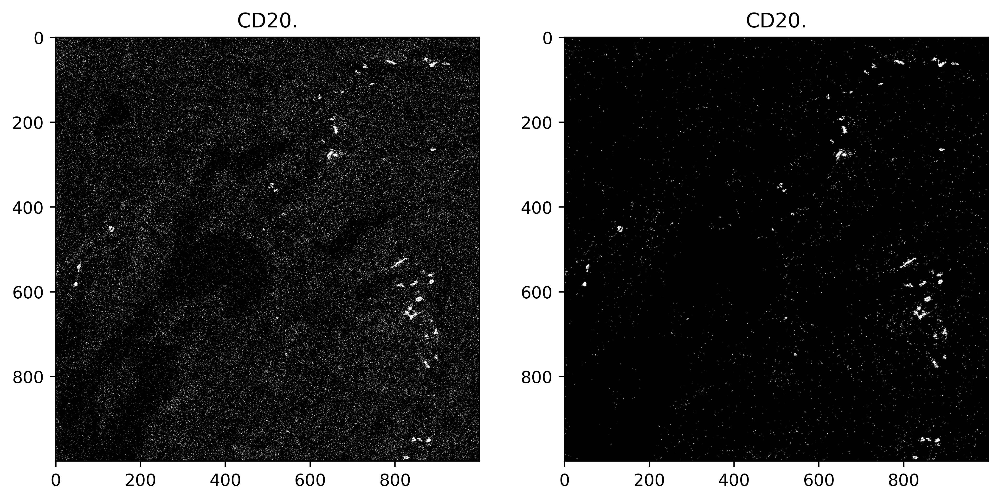

In [24]:
channel_to_compare = 'CD20.'
directory = Path('../data/IMC_ESD/raw')
matching_files = [str(file) for file in directory.rglob('*') if channel_to_compare in file.name]


images_ch = []
images_ch_norm = []
imgs_images_ch_norm_p = []

PERCENTILE = 60
THRESHOLD = 0.10

start = time.time()

for img in matching_files:
    img_p = IP.parse_image(img)
    img_out = IP.remove_outliers(img_p, up_limit=99, down_limit=1)
    img_norm = IP.normalize_by_channel(img_out)
    images_ch.append(img_p)
    images_ch_norm.append(img_norm)
    # apply threshold
    filtered = IPrep.thresholding(img_norm, th=THRESHOLD)
    # apply percentile
    filtered = IPrep.percentile_filter(filtered, window_size=3, percentile=PERCENTILE)
    imgs_images_ch_norm_p.append(filtered)
     
end = time.time()
print(f"{end - start} seconds for {len(images_ch_norm)} images")


plot_comparison(images_ch[2], imgs_images_ch_norm_p[2], channel_to_compare)

One can tune the parameters of thresholding and percentiles and check how the resuting images change. Have fun! 

In [32]:
# image = [
#     [0,1,0,0,1,0,0,1,1],
#     [0,1,1,0,0,0,1,1,1],
#     [0,0,1,1,0,0,0,1,1],
#     [1,0,0,1,0,0,1,0,1],
#     [0,0,1,0,1,0,0,1,1],
#     [0,0,0,0,0,0,0,1,1],
#     [1,0,1,1,1,1,1,1,1],
#     [0,0,1,1,1,1,1,1,1],
#     [1,1,1,1,1,1,1,1,1],

# ]

# image = np.array(image)
# from scipy.ndimage import percentile_filter

# window_size=3
# kernel = np.ones((window_size, window_size))
# percentile_blur = percentile_filter(image,
#                                     percentile=25,
#                                     footprint=kernel)
# print(percentile_blur*image)

(9, 9)
[[0 0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1 1]
 [0 0 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1]]
